

# Project: Investigate child mortality with the GDP per capita growth and the relationship of fertility and life expectancy in different regions of the world

## Table of Contents
### 1. Introduction
### 2. Data Wrangling
### 3. Exploratory Data Analysis
### 4. Conclusion

<a id='intro'></a>
## 1. Introduction
I am performing my investigation on the gapminder dataset related to child mortality, my focus of investigation is on effects of gdp and fertility rate on child mortality. The growth in gdp affects all the stakeholders of a society.  I am using the data of Gdp per capita, fertility rate, population, life expectancy and mortality rate. I will investigate the role of gdp as a key deciding factor.
### Questions
- Q.1) Does the gdp per capita growth over the years have a positive impact on child mortality?
- Q.2) Does East Asia Pacific and America show the same trend in Child mortality and Life Expectancy?
- Q.3) Which are the top 10 countries with the highest and lowest child mortality rate?
- Q.4) What are the trends of life expectancy and child mortality in Pakistan?



In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import missingno as msno
import seaborn as sns
%config InlineBackend.figure_format='svg'

<a id='wrangling'></a>
## Data Wrangling

Import the file "gdp.csv", this contains gapminder data for Life expectancy, Child mortality, Fertility,GDP, Population of the world from 1964 to 2013.

### General Properties

In [4]:
df_gdp = pd.read_csv('/Users/Raazia/Udacity-NanoDegree/Project#2/data/gdp_all.csv')

In [5]:
df_gdp.head()

,year,country,fertility,life,population,child_mortality,gdp,region
0,1964,Afghanistan,7.671,33.639,10474903.0,339.70,1182.0,South Asia
1,1964,Albania,5.711,65.475,1817098.0,122.67,3023.0,Europe & Central Asia
2,1964,Algeria,7.653,47.953,11654905.0,247.30,5693.0,Middle East & North Africa
3,1964,Angola,7.425,34.604,5337063.0,305.20,4573.0,Sub-Saharan Africa
4,1964,Antigua and Barbuda,4.250,63.775,58653.0,72.78,5008.0,America


### Data Description
 - 'year' - year from 1964 to 2010
 - 'country' - Countries
 - 'fertility' - Fertility rate, the number of children that would be born to each woman
 - 'life' - The average number of years a new born child would live 
 - 'population' - Total population 
 - 'child_mortality' - Death of children over 5 years of age per 1000 live births
 - 'gdp' - Gross domestic product per capita
 - 'region' - regions of the world

In [4]:
# Check the number of rows and columns of the dataframe
df_gdp.shape

(10111, 8)

In [5]:
# Check the data types for all the columns
df_gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10111 entries, 0 to 10110
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   year             10111 non-null  int64  
 1   country          10111 non-null  object 
 2   fertility        10100 non-null  float64
 3   life             10111 non-null  float64
 4   population       10108 non-null  float64
 5   child_mortality  9210 non-null   float64
 6   gdp              9000 non-null   float64
 7   region           10111 non-null  object 
dtypes: float64(5), int64(1), object(2)
memory usage: 632.1+ KB


In [6]:
# Perform statistical analysis of the numeric columns
df_gdp.describe()

,year,fertility,life,population,child_mortality,gdp
count,10111.000000,10100.000000,10111.000000,1.010800e+04,9210.000000,9000.000000
mean,1988.514588,4.028719,64.078600,2.560448e+07,80.834505,12746.916667
std,14.430849,2.013968,11.122779,1.032383e+08,79.220942,17797.809953
min,1964.000000,0.836000,6.000000,1.170000e+03,2.000000,142.000000
25%,1976.000000,2.175750,56.282500,8.874062e+05,18.900000,2263.000000
50%,1989.000000,3.632500,67.157000,4.765781e+06,50.700000,6438.500000
75%,2001.000000,5.905250,72.484000,1.476995e+07,121.775000,15887.250000
max,2013.000000,9.223000,83.580000,1.359368e+09,435.800000,182668.000000


Life expectancy has grown positively from 1964 to 2010,the average rose from 0.2 to 83.4.
Child mortality has shown the largest growth from approximately 435 to 2. 
Life expectancy has gone up from 0.8 to 9.2.
These three factors are directly proportional to GDP. It serves as a gauge of our economy's overall size and health. If shows that the people have access to health care and basic necessities of life.

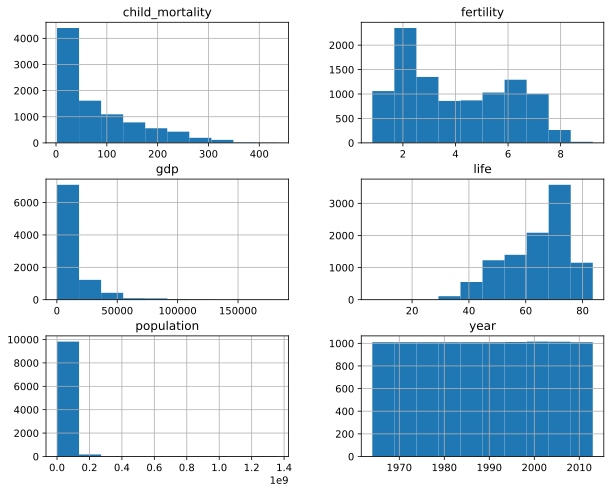

In [7]:
#Take a look at the data distribution
df_gdp.hist(figsize=(10,8));

Child mortality, gdp and population are skewed to the left, mean and the median are in the same bin.
whereas life expectancy is skewed to the right.

In [8]:
# Check for the total number of Null data values
df_gdp.isna().sum()

year                  0
country               0
fertility            11
life                  0
population            3
child_mortality     901
gdp                1111
region                0
dtype: int64

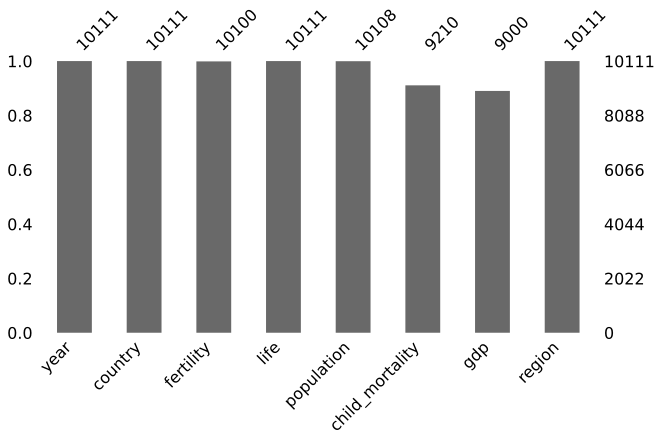

In [9]:
#Visualize the null data values of the numeric columns
msno.bar(df_gdp, figsize = (10,5));

There are only 3 null values in the population column, 901 in child_mortality, 1111 in gdp and 11 in fertility. I will fill the null values of child_mortality, gdp and fertility with mean values. Wherese, I would like to drop the rows of null values for population column.

In [10]:
#Drop the null values from the population column
df_gdp.dropna(axis=0, subset=['population'],inplace=True)

In [11]:
#Check the number of null values in the remaining columns
df_gdp.isna().sum()

year                  0
country               0
fertility             8
life                  0
population            0
child_mortality     898
gdp                1108
region                0
dtype: int64

In [12]:
# Fill the null data values with mean
df_gdp.fillna(df_gdp.mean(),inplace=True)

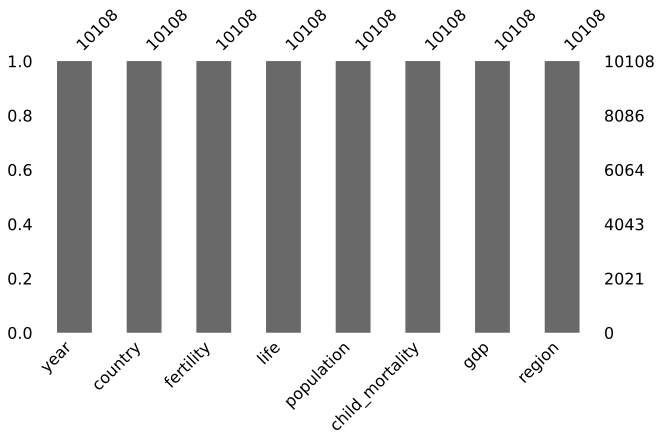

In [13]:
#Make sure there are no null data values
msno.bar(df_gdp, figsize = (10,5));

<a id='eda'></a>
## Exploratory Data Analysis
Gdp is my independent variable and child mortality,and life expectancy are my dependent variables. I expect that these with the increase in the gdp per capita child mortality and life expectancy goes down and vice versa. Whereas there is an inverse relationship between population growth and gdp per capita.

### Research Question 1 :- Does the gdp per capita growth over the years have a positive impact on child mortality?


In [14]:
# Set the seaborn environment for visualizations
sns.set()

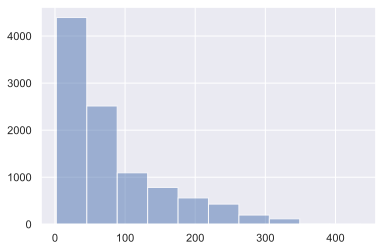

In [15]:
#Check the distirbution of child mortality data
df_gdp.child_mortality.hist(alpha=0.5)

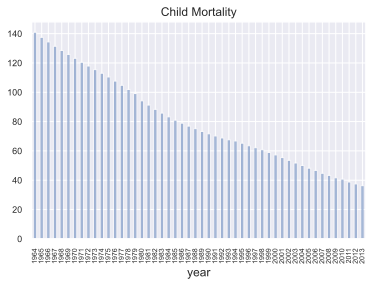

In [160]:
#Plot child mortality over the years
df_gdp.groupby('year')['child_mortality'].mean().plot(kind='bar', title='Child Mortality',alpha=0.5);
plt.xticks(size=7,rotation=90);
plt.yticks(size=9);

This graph clearly shows that the number of child births have decreased from 1964 to 2013, this might be attributed to the faact that there are has been considerable advancement in the field of medicine

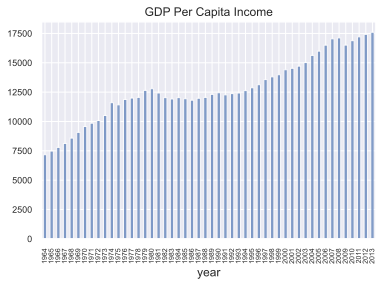

In [17]:
df_gdp.groupby('year')['gdp'].mean().plot(kind='bar', title='GDP Per Capita Income',alpha=0.7);
plt.xticks(size=7,rotation=90);
plt.yticks(size=9);

GDP has grown from 1964 to 2013, although there had been a few ups an downs but the overall trend is showing an increase in GDP per capita.

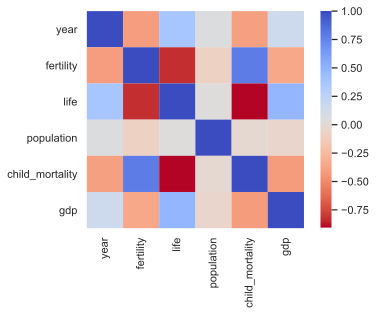

In [149]:
sns.heatmap(df_gdp.corr(), square=True, cmap='coolwarm_r')

There is a negative correlation between GDP and Child Mortality.

In [20]:
df1=df_gdp.groupby(['region'])

In [21]:
df1.ngroups

6

In [22]:
df1.head(1)

,year,country,fertility,life,population,child_mortality,gdp,region
0,1964,Afghanistan,7.671,33.639,10474903.0,339.70,1182.0,South Asia
1,1964,Albania,5.711,65.475,1817098.0,122.67,3023.0,Europe & Central Asia
2,1964,Algeria,7.653,47.953,11654905.0,247.30,5693.0,Middle East & North Africa
3,1964,Angola,7.425,34.604,5337063.0,305.20,4573.0,Sub-Saharan Africa
4,1964,Antigua and Barbuda,4.250,63.775,58653.0,72.78,5008.0,America
8,1964,Australia,3.154,70.650,11122567.0,22.70,16098.0,East Asia & Pacific


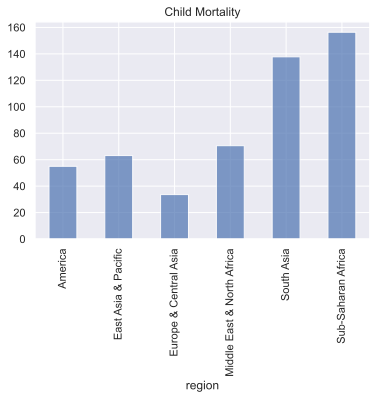

In [153]:
#Plotting child mortality in different regions of the world
df_gdp.groupby('region')['child_mortality'].mean().plot(kind='bar', title='Child Mortality',alpha=0.7);

Sub-Saharan Africa has the highest mortality rate, whereas Europe & Central Asia have the smallest mortality rate

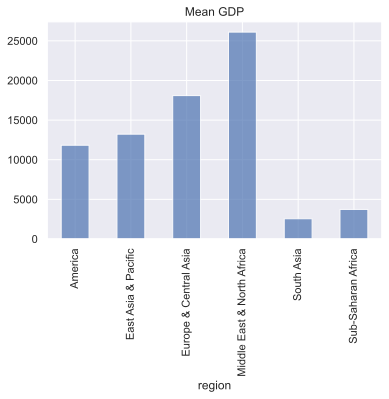

In [23]:
#Plotting mean GDP for different region of the world
df_gdp.groupby('region')['gdp'].mean().plot(kind='bar', title='Mean GDP',alpha=0.7);

South Asia has the lowest mean GDP and MIddle East & North Africa has the highest mean GDP.

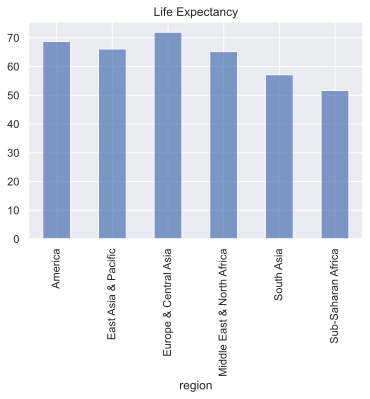

In [152]:
# Plotting life expectancy agains different regions of the world
df_gdp.groupby('region')['life'].mean().plot(kind='bar', title='Life Expectancy',alpha=0.7);

Mean life expectancy is above 70 years for Europe & Central Asia and over 50 years for Sub-Saharan Africa.

In [27]:
import plotly.express as px
px.scatter(df_gdp, y='gdp',x='child_mortality',animation_frame='year',
           animation_group='country',size='population',color='region',
           hover_name='country',log_x=False,size_max=55,range_y=[100,80000],range_x=[2, 400]
          )

This is a time series bubble map which shows the relationship between GDP and child mortality. The size of the bubbles is based on the population of the country.

In [31]:
df1.head(1)

,year,country,fertility,life,population,child_mortality,gdp,region
0,1964,Afghanistan,7.671,33.639,10474903.0,339.70,1182.0,South Asia
1,1964,Albania,5.711,65.475,1817098.0,122.67,3023.0,Europe & Central Asia
2,1964,Algeria,7.653,47.953,11654905.0,247.30,5693.0,Middle East & North Africa
3,1964,Angola,7.425,34.604,5337063.0,305.20,4573.0,Sub-Saharan Africa
4,1964,Antigua and Barbuda,4.250,63.775,58653.0,72.78,5008.0,America
8,1964,Australia,3.154,70.650,11122567.0,22.70,16098.0,East Asia & Pacific


In [159]:
x='gdp'
y='life'
s='life'
c='life'
plt.figure(figsize=(10,5))
plt.scatter(x=df_gdp['gdp'],y=df_gdp['child_mortality'],c=df_gdp['life'] ,
            s=df_gdp['life'] ,cmap='rainbow', alpha=0.7)    
plt.colorbar().set_label('Life Expectancy',fontsize=14)
plt.xlabel('GDP Per Capita')
plt.ylabel('Child Mortality');

This map shows that there is an inverse correlation between GDP and child mortality and life expectancy.

## Question 2) Does East Asia Pacific and America show the same trend in Child mortality and Life Expectancy

In [113]:
# selecting records in gdp data for east Asia Pacific region and America region
df_EA = df_gdp[(df_gdp.region == 'East Asia & Pacific')| (df_gdp.region == 'America')]
df_EA.head(1)

,year,country,fertility,life,population,child_mortality,gdp,region
4,1964,Antigua and Barbuda,4.25,63.775,58653.0,72.78,5008.0,America


In [114]:
df_EA.reset_index(inplace=True)

In [115]:
df_EA.head()

,index,year,country,fertility,life,population,child_mortality,gdp,region
0,4,1964,Antigua and Barbuda,4.250,63.775,58653.0,72.780000,5008.0,America
1,5,1964,Argentina,3.068,65.388,21966478.0,57.430000,8227.0,America
2,7,1964,Aruba,4.059,67.113,57031.0,80.834505,5505.0,America
3,8,1964,Australia,3.154,70.650,11122567.0,22.700000,16098.0,East Asia & Pacific
4,11,1964,Bahamas,4.220,64.189,133709.0,48.560000,18160.0,America


In [116]:
df_EA.drop(columns={'index'}, axis=1, inplace=True)

/Users/Raazia/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [117]:
df_EA.head()

,year,country,fertility,life,population,child_mortality,gdp,region
0,1964,Antigua and Barbuda,4.250,63.775,58653.0,72.780000,5008.0,America
1,1964,Argentina,3.068,65.388,21966478.0,57.430000,8227.0,America
2,1964,Aruba,4.059,67.113,57031.0,80.834505,5505.0,America
3,1964,Australia,3.154,70.650,11122567.0,22.700000,16098.0,East Asia & Pacific
4,1964,Bahamas,4.220,64.189,133709.0,48.560000,18160.0,America


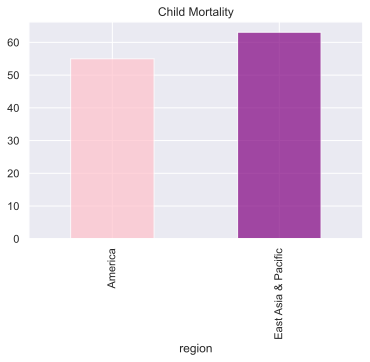

In [139]:
df_EA.groupby('region')['child_mortality'].mean().plot(kind='bar', title='Child Mortality',alpha=0.7, color=['pink', 'purple']);

In [142]:
import plotly.express as px
px.scatter(df_EA, x='gdp',y='child_mortality',animation_frame='year',
           animation_group='country',size='population',color='region',
           hover_name='country',log_x=False,size_max=55)

East Asia Pacific has a higher rate of child mortality, whereas America has a little lower rate

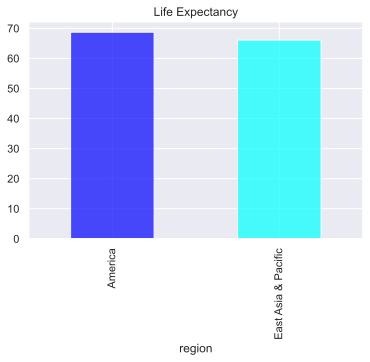

In [134]:
df_EA.groupby('region')['life'].mean().plot(kind='bar', title='Life Expectancy',alpha=0.7, color=['blue', 'cyan']);

In [143]:
import plotly.express as px
px.scatter(df_EA, x='gdp',y='life',animation_frame='year',
           animation_group='country',size='population',color='region',
           hover_name='country',log_x=False,size_max=55)

America has a life expectancy of almost 70 years whereas East Asia PAcific has around 68 years. Thereby Life expectancy shows almost similar trend for East Asia Pacific and America

## Q3) Which are the top 10 countries with the highest and lowest child mortality rate?

In [38]:
# Create a dataframe sorted with the highest child mortality rate
df_max = pd.DataFrame(columns=["year","country","fertility","life","population","child_mortality","gdp","region"])
y = []
c = []
f = []
l = []
p = []
cm = []
g = []
r = []
for i in df_gdp.country.unique():
    temp = df_gdp.loc[df_gdp.country==i].sort_values('child_mortality',ascending=False).iloc[0,:]
    y.append(temp['year'])
    c.append(temp['country'])
    f.append(temp['fertility'])
    l.append(temp['life'])
    p.append(temp['population'])
    cm.append(temp['child_mortality'])
    g.append(temp['gdp'])
    r.append(temp['region'])
df_max['year'] = y
df_max['country'] = c
df_max['fertility'] = f
df_max['life'] = l
df_max['population'] = p
df_max['child_mortality'] = cm
df_max['gdp'] = g
df_max['region'] = r

### Top 10 countries with highest Child Mortality Rate

In [39]:
#Top 10 countries with the highest child mortality rate
df_top10=df_max.nlargest(10,'child_mortality')

In [41]:
#reset index
df_top10.reset_index(inplace=True)

In [42]:
#Drop the unwanted index column
df_top10.drop(['index'],axis = 1, inplace=True)

In [43]:
df_top10

,level_0,year,country,fertility,life,population,child_mortality,gdp,region
0,0,1964,Mali,6.793,29.097,5522231.0,435.80,799.0,Sub-Saharan Africa
1,1,1964,Sierra Leone,6.302,31.263,2333500.0,372.60,1333.0,Sub-Saharan Africa
2,2,1964,Malawi,7.060,38.710,3877813.0,355.20,391.0,Sub-Saharan Africa
3,3,1964,South Sudan,6.781,33.361,2600994.0,348.10,2318.0,Sub-Saharan Africa
4,4,1964,Guinea,6.131,35.588,3759549.0,344.30,870.0,Sub-Saharan Africa
5,5,1964,Afghanistan,7.671,33.639,10474903.0,339.70,1182.0,South Asia
6,6,1964,Gambia,5.776,33.523,402436.0,338.30,1312.0,Sub-Saharan Africa
7,7,1974,Niger,7.553,37.045,4923337.0,338.00,1148.0,Sub-Saharan Africa
8,8,1964,Burkina Faso,6.414,36.331,5195464.0,331.00,711.0,Sub-Saharan Africa
9,9,1980,Timor-Leste,4.767,34.402,580707.0,330.93,832.0,East Asia & Pacific


In [64]:
#Top 10 countries with the lowest child mortality rate
df_bottom10=df_max.nsmallest(10,'child_mortality')

In [65]:
#reset index
df_bottom10.reset_index(inplace=True)

In [66]:
#Drop the unwanted index column
df_bottom10.drop(['index'],axis = 1, inplace=True)

In [76]:
df_bottom10.head()

,year,country,fertility,life,population,child_mortality,gdp,region
0,1964,Sweden,2.475,73.73,7676568.0,17.1,18434.0,Europe & Central Asia
1,1964,Netherlands,3.170,73.73,12055386.0,18.8,15204.0,Europe & Central Asia
2,1964,Iceland,3.736,73.57,189148.0,19.7,13450.0,Europe & Central Asia
3,1964,Norway,2.960,73.61,3693750.0,20.4,18118.0,Europe & Central Asia
4,1964,Finland,2.580,69.37,4545748.0,21.3,12389.0,Europe & Central Asia


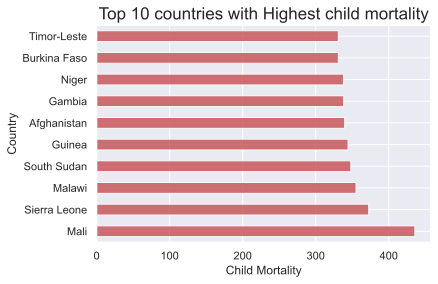

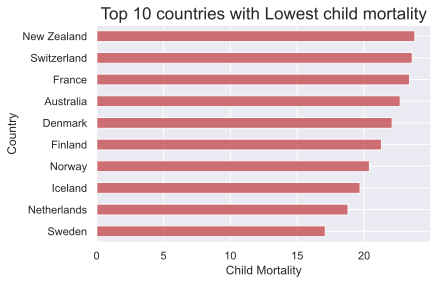

In [73]:
#Visualize the data using a horizontal bar chart
df_top10.plot(x='country',y='child_mortality',kind='barh',legend=False, color='r',alpha=0.8);
plt.title('Top 10 countries with Highest child mortality',size=17);
plt.xlabel('Child Mortality');
plt.ylabel('Country');
df_bottom10.plot(x='country',y='child_mortality',kind='barh',legend=False, color='r', alpha=0.8);
plt.title('Top 10 countries with Lowest child mortality',size=17);
plt.xlabel('Child Mortality');
plt.ylabel('Country');

### The relationship of  Child Mortality with GDP

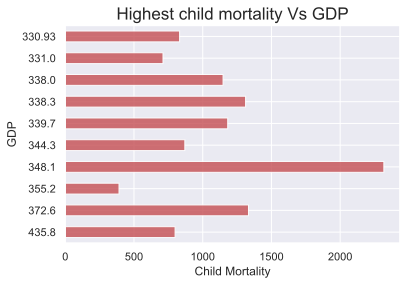

In [74]:
#Visualize the relationship between the countries with high mortality rate and GDP
df_top10.plot(x='child_mortality',y='gdp',kind='barh',legend=False,color='r',alpha=0.8);
plt.title('Highest child mortality Vs GDP',size=17);
plt.xlabel('Child Mortality');
plt.ylabel('GDP');

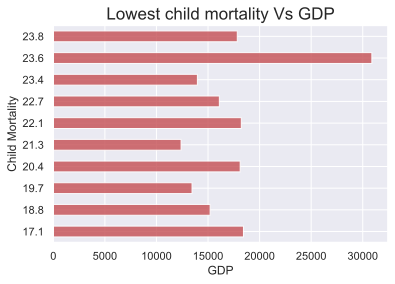

In [75]:
#Visualize the relationship between the countries with low mortality rate and GDP
df_bottom10.plot(x='child_mortality',y='gdp',kind='barh',legend=False, color='r',alpha=0.8);
plt.title('Lowest child mortality Vs GDP',size=17);
plt.xlabel('GDP');
plt.ylabel('Child Mortality');

It shows that the to 10 countries with a lower GDP per capita has a high child mortality rate, whereas the top 10 countries with a low child mortality rate have a high GDP per capita.

## Quesition 4) What are the trends of life expectancy and child mortality in Pakistan?

In [165]:
df_gdp.country.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana',
       'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi',
       'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Central African Rep.', 'Chad', 'Channel Islands', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus',
       'Czech Rep.', 'Denmark', 'Djibouti', 'Dominican Rep.', 'Ecuador',
       'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'French Guiana',
       'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany',
       'Ghana', 'Greece', 'Greenland', 'Grenada', 'Guadeloupe', 'Gu

In [185]:
# selecting records in gdp data for east Asia Pacific region and America region
df_P = df_gdp[df_gdp.country == 'Pakistan']
df_P.head()

,year,country,fertility,life,population,child_mortality,gdp,region
137,1964,Pakistan,6.6,49.807,50678979.0,224.3,1396.0,South Asia
339,1965,Pakistan,6.6,50.530,51993059.0,216.7,1421.0,South Asia
541,1966,Pakistan,6.6,51.200,53359180.0,209.8,1497.0,South Asia
743,1967,Pakistan,6.6,51.823,54780499.0,203.8,1513.0,South Asia
945,1968,Pakistan,6.6,52.405,56257610.0,198.3,1577.0,South Asia


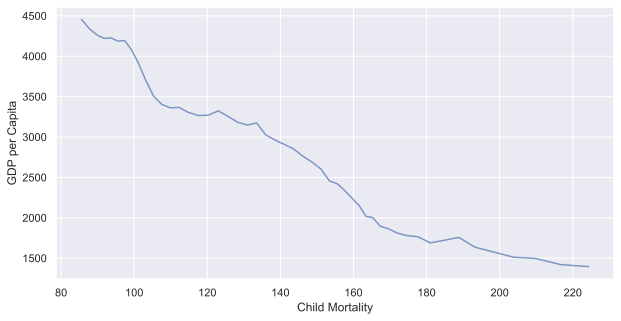

In [186]:
plt.figure(figsize=(10,5))
plt.plot(df_P['child_mortality'],df_P['gdp'], alpha=0.7)    
plt.xlabel('Child Mortality')
plt.ylabel('GDP per Capita');

<a id='conclusions'></a>
## Conclusions



> **Tip**: Once you are satisfied with your work, you should save a copy of the report in HTML or PDF form via the **File** > **Download as** submenu. Before exporting your report, check over it to make sure that the flow of the report is complete. You should probably remove all of the "Tip" quotes like this one so that the presentation is as tidy as possible. Congratulations!